In [50]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Read the dataset

df = pd.read_csv('wine.csv')
df.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735


In [69]:
# Check duplicates
df.duplicated().sum()

0

In [70]:
# Check missing values
df.isna().sum()

Type               0
Alcohol            0
Malic              0
Ash                0
Alcalinity         0
Magnesium          0
Phenols            0
Flavanoids         0
Nonflavanoids      0
Proanthocyanins    0
Color              0
Hue                0
Dilution           0
Proline            0
dtype: int64

In [3]:
# check data types
df.dtypes

Type                 int64
Alcohol            float64
Malic              float64
Ash                float64
Alcalinity         float64
Magnesium            int64
Phenols            float64
Flavanoids         float64
Nonflavanoids      float64
Proanthocyanins    float64
Color              float64
Hue                float64
Dilution           float64
Proline              int64
dtype: object

In [5]:
# All have either int or float type
# Descriptive statistics
df.describe()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


<Axes: >

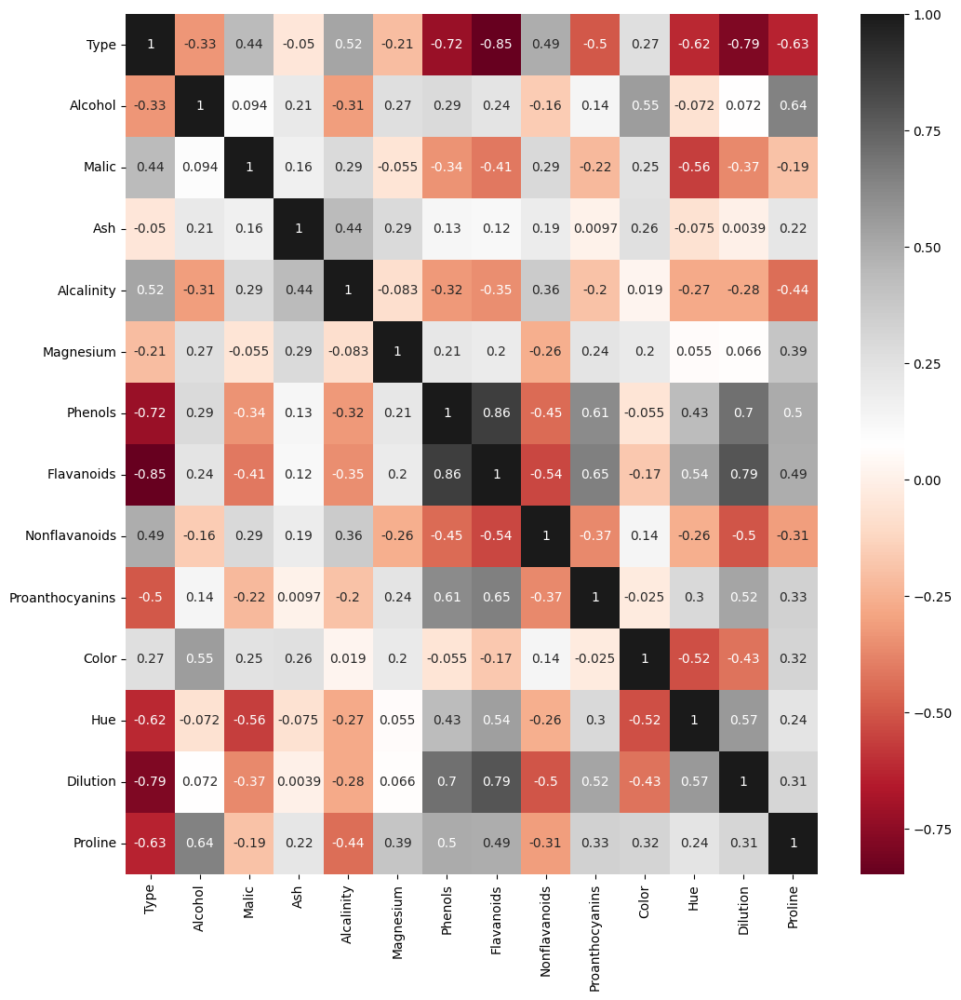

In [52]:
# Correlation 
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(),annot=True,cmap='RdGy')

We see from the correlation matrix that all of the features are highly or moderately correlated with other features.

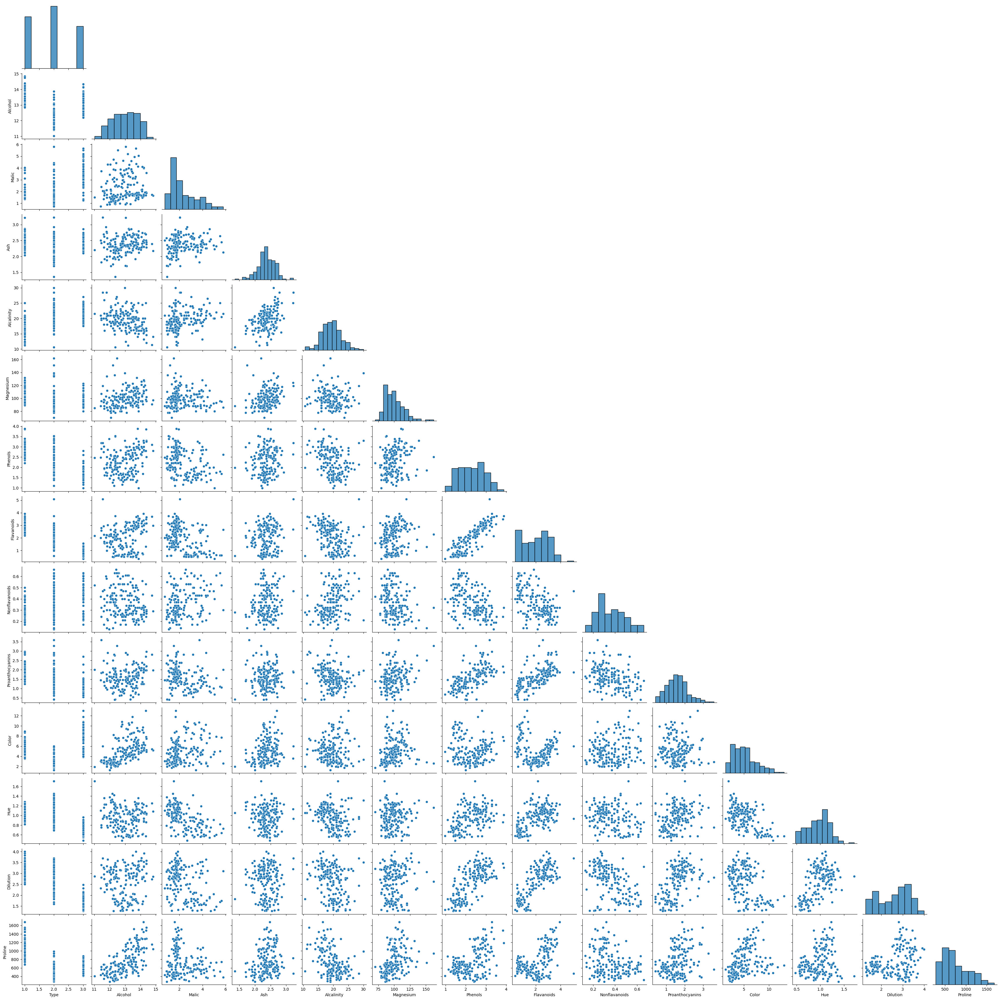

In [54]:
# Plot pairplot

sns.pairplot(df, palette='rocket',corner=True)

In [7]:
# Standardize the data set values
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

scaleddf = sc.fit_transform(df)

<Axes: >

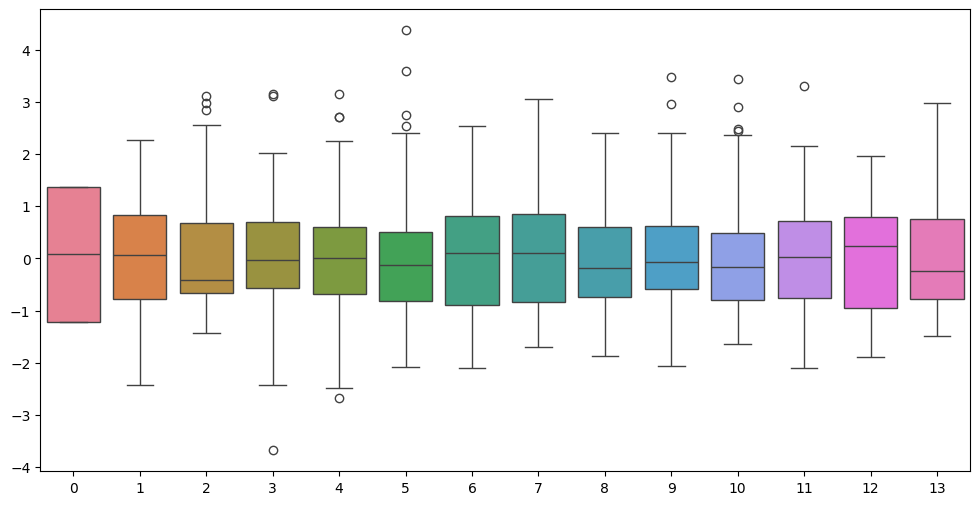

In [62]:
plt.figure(figsize=(12,6))
sns.boxplot(scaleddf)

We see that many of the columns have outliers.

In [10]:
# Find out the covariance of the transpose of the scaled data

cov = np.cov(scaleddf.T)
cov

array([[ 1.00564972, -0.3300763 ,  0.44024952, -0.04992369,  0.52078487,
        -0.21036119, -0.72322641, -0.85228566,  0.49187249, -0.50194977,
         0.26716852, -0.62085717, -0.79268286, -0.63729711],
       [-0.3300763 ,  1.00564972,  0.09493026,  0.21273976, -0.31198788,
         0.27232816,  0.29073446,  0.23815287, -0.15681042,  0.13747022,
         0.549451  , -0.07215255,  0.07275191,  0.64735687],
       [ 0.44024952,  0.09493026,  1.00564972,  0.16497228,  0.29013035,
        -0.05488343, -0.3370606 , -0.41332866,  0.29463237, -0.22199334,
         0.25039204, -0.56446685, -0.37079354, -0.19309537],
       [-0.04992369,  0.21273976,  0.16497228,  1.00564972,  0.44587209,
         0.28820583,  0.12970824,  0.11572743,  0.1872826 ,  0.00970647,
         0.2603499 , -0.07508874,  0.00393333,  0.22488969],
       [ 0.52078487, -0.31198788,  0.29013035,  0.44587209,  1.00564972,
        -0.0838039 , -0.32292752, -0.353355  ,  0.36396647, -0.19844168,
         0.01883781, -0.27

In [11]:
# Obtain Eigen values and Eigen vectors

values, vectors = np.linalg.eig(cov)

In [29]:
# Find out the highest eigen value

values[::-1]

array([5.56722458, 2.51118402, 1.45424413, 0.9331603 , 0.88246016,
       0.67657935, 0.55692777, 0.35201176, 0.29620602, 0.26378805,
       0.2271244 , 0.16975037, 0.13029618, 0.05813894])

In [21]:
# Find the corresponding Eigen vectors for the highest Eigen value

vectors[:,0]

array([-0.39366953,  0.13632501, -0.22267638,  0.00225793, -0.22429849,
        0.12463016,  0.35926404,  0.39071171, -0.2670012 ,  0.2790625 ,
       -0.08931829,  0.27682265,  0.35052618,  0.26951525])

### **Matrix Multiplication**

In [22]:
# First Principal component = Scaled dataframe x Eigen vectors of maximum Eigen value

pc1 = scaleddf@vectors[:,0]
pc1

array([ 3.5229339 ,  2.52885806,  2.78502898,  3.92258841,  1.40751111,
        3.28812981,  2.75057754,  2.39286652,  2.79525633,  3.00559666,
        3.67868855,  2.10963477,  2.43845636,  3.67349453,  4.44157575,
        2.60892387,  2.47542846,  2.22623243,  3.74226929,  2.3944115 ,
        3.33656895,  1.48140399,  2.82806867,  2.00771405,  2.11463604,
        1.39753751,  2.13348803,  1.62970383,  2.50760753,  2.55948318,
        2.77244452,  2.93513374,  1.99124842,  2.24570987,  1.78698628,
        2.22763867,  1.76802847,  1.52317798,  1.87236494,  2.79711434,
        2.84093569,  1.1055721 ,  3.30689482,  0.90479842,  2.39683569,
        1.53781235,  2.99121644,  3.05931631,  2.31877146,  2.95947229,
        3.4121813 ,  3.11637827,  3.70021113,  2.53754828,  2.44478924,
        2.72281451,  2.98531677,  2.4881469 ,  3.35128665, -0.87492504,
       -1.41466076, -1.71387916,  0.01229686,  1.83310122, -0.57453595,
        0.79147116,  2.02003148,  0.14328098, -0.75150766,  1.74

In [23]:
# Second principal componenet = Scaled dataframe x Eigen vectors of second highest Eigen value

pc2 = scaleddf@vectors[:,1]
pc2

array([-1.45309844,  0.33001925, -1.03693595, -2.76821026, -0.86777309,
       -2.13017513, -1.17916999, -1.61128232, -0.92317952, -0.79628417,
       -1.31252342, -0.61298199, -0.67852331, -1.14012136, -2.11031917,
       -1.66641801, -2.33089672, -1.63359016, -2.52840527, -1.06452946,
       -0.79601279, -0.24008547,  0.08685755,  0.51561649,  0.31592057,
       -0.93821529, -0.68710205,  0.09118403, -0.69274983, -0.1954729 ,
       -1.24635279, -1.47827883, -0.05325201, -1.6346691 , -0.69748039,
       -0.17928892, -0.65787231, -0.11222505,  0.76930576, -1.80880887,
       -0.78616157, -0.16588492, -1.16395547, -0.32607243,  0.06690594,
       -1.77507765, -1.19762255, -0.65382196, -1.25023668, -1.75860365,
       -0.17691581, -0.75210873, -1.62309187, -1.87852793, -1.02071516,
       -1.33524369, -1.44363759, -1.2154925 , -1.74060283,  3.07772383,
        1.3899542 ,  0.83885608,  1.26269589,  1.91338608,  1.91115097,
        0.75872552,  1.87213142,  2.42575691,  0.22520902,  1.39

## **PCA**

In [64]:
# Create a dataframe for storing all PCs

from sklearn.decomposition import PCA

pca = PCA()

pcs = pd.DataFrame(pca.fit_transform(scaleddf), columns=['PC'+str(i) for i in range(1,15)])

pcs

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
0,-3.522934,-1.453098,-0.164795,-0.013273,0.737345,-0.300716,0.573876,0.055637,-0.458765,1.065570,-0.420494,0.552928,-0.302978,0.200857
1,-2.528858,0.330019,-2.026707,-0.417144,-0.283214,-0.884309,-0.029716,1.010372,0.218806,-0.020182,-0.130020,0.394971,-0.146645,0.126402
2,-2.785029,-1.036936,0.983238,0.664232,-0.387565,0.468842,0.488305,-0.268957,1.222769,-0.106249,-0.279074,0.001898,0.021278,-0.055752
3,-3.922588,-2.768210,-0.174968,0.565088,-0.324360,0.262616,-0.398364,0.618844,-0.114658,0.107671,0.773866,-0.230929,-0.501277,0.019903
4,-1.407511,-0.867773,2.025829,-0.440906,0.227949,-0.593762,0.447876,0.434937,-0.261548,0.112434,-0.537931,-0.226686,0.274109,-0.517498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3.627996,-2.206617,-0.343668,0.751705,-1.004109,-1.143155,0.843455,-0.206626,-0.125419,-0.392619,0.136783,0.174807,-0.198803,0.093951
174,2.942729,-1.752263,0.207480,0.399381,0.154223,-0.062465,0.139947,-0.565588,0.055341,-0.236267,0.254286,-0.277519,-0.185064,-0.024277
175,3.027272,-2.756040,-0.940803,0.607758,1.128136,0.005290,0.733026,0.052545,-0.027881,-0.212749,0.502640,0.693336,0.167036,-0.031696
176,2.755222,-2.293784,-0.550474,-0.391570,1.067083,1.012562,0.755423,0.426512,0.048784,0.479793,0.313786,0.344120,-0.109515,0.102823


In [65]:
# How the information are captured in each PCAs

pca.explained_variance_ratio_

array([0.39542486, 0.17836259, 0.10329102, 0.06627984, 0.06267875,
       0.0480556 , 0.03955707, 0.02500244, 0.02103871, 0.01873615,
       0.01613203, 0.01205691, 0.00925458, 0.00412945])

In [66]:
# Use cumulative sum for finding out how much % of data we need for the analysis

np.cumsum(pca.explained_variance_ratio_)

array([0.39542486, 0.57378745, 0.67707846, 0.74335831, 0.80603706,
       0.85409266, 0.89364973, 0.91865217, 0.93969088, 0.95842703,
       0.97455906, 0.98661596, 0.99587055, 1.        ])

Ideally for data analysis we can consider a 90% information retaining, which indicates selecting first 8 componenets.
Whereas for data visualization we can select 2 or 3 components.

In [80]:
# PCA with 2 componenets
pca = PCA(n_components=2)
pcs = pca.fit_transform(scaleddf)

pcs_df = pd.DataFrame(pcs)
pcs_df

,0,1
0,-3.522934,-1.453098
1,-2.528858,0.330019
2,-2.785029,-1.036936
3,-3.922588,-2.768210
4,-1.407511,-0.867773
...,...,...
173,3.627996,-2.206617
174,2.942729,-1.752263
175,3.027272,-2.756040
176,2.755222,-2.293784


In [74]:
pca.explained_variance_ratio_

array([0.39542486, 0.17836259])

In [83]:
pcs_df[0]

0     -3.522934
1     -2.528858
2     -2.785029
3     -3.922588
4     -1.407511
         ...   
173    3.627996
174    2.942729
175    3.027272
176    2.755222
177    3.496336
Name: 0, Length: 178, dtype: float64

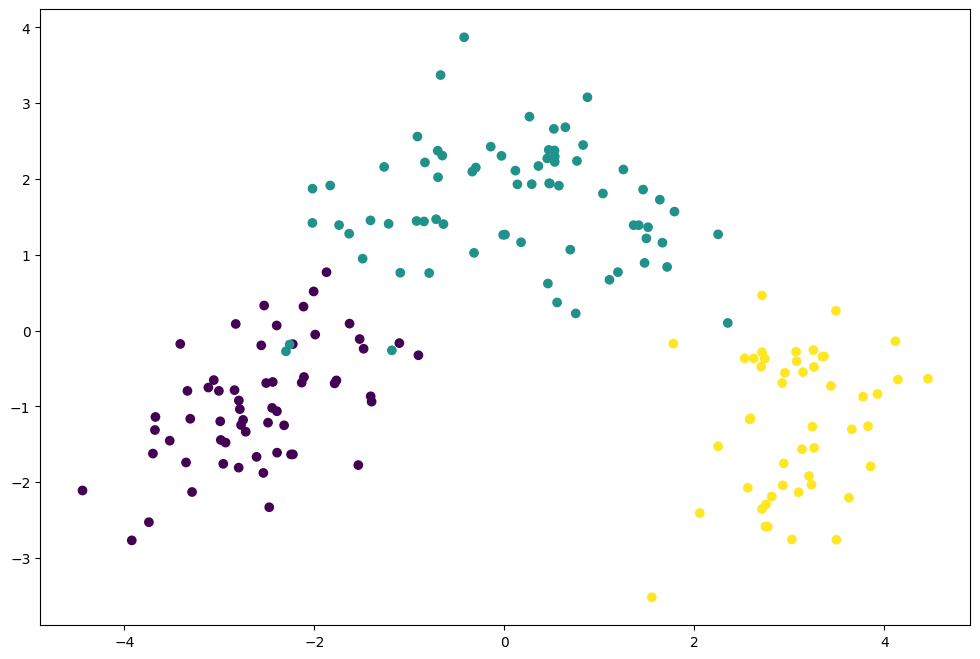

In [86]:
# plot the two features

plt.figure(figsize=(12,8))
plt.scatter(pcs_df[0],pcs_df[1],c=df['Type'],cmap='viridis')

In [88]:
# Create a new PCA for components = 8 (90% data)

pca = PCA(n_components=8)
pcs = pca.fit_transform(scaleddf)

pcs_df = pd.DataFrame(pcs,columns=['PC'+str(i) for i in range(1,9)])

pcs_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,-3.522934,-1.453098,-0.164795,-0.013273,0.737345,-0.300716,0.573876,0.055637
1,-2.528858,0.330019,-2.026707,-0.417144,-0.283214,-0.884309,-0.029716,1.010372
2,-2.785029,-1.036936,0.983238,0.664232,-0.387565,0.468842,0.488305,-0.268957
3,-3.922588,-2.768210,-0.174968,0.565088,-0.324360,0.262616,-0.398364,0.618844
4,-1.407511,-0.867773,2.025829,-0.440906,0.227949,-0.593762,0.447876,0.434937
...,...,...,...,...,...,...,...,...
173,3.627996,-2.206617,-0.343668,0.751705,-1.004109,-1.143155,0.843455,-0.206626
174,2.942729,-1.752263,0.207480,0.399381,0.154223,-0.062465,0.139947,-0.565588
175,3.027272,-2.756040,-0.940803,0.607758,1.128136,0.005290,0.733026,0.052545
176,2.755222,-2.293784,-0.550474,-0.391570,1.067083,1.012562,0.755423,0.426512


In [91]:
# Check the Cumulative explained variance ratio
np.cumsum(pca.explained_variance_ratio_)

array([0.39542486, 0.57378745, 0.67707846, 0.74335831, 0.80603706,
       0.85409266, 0.89364973, 0.91865217])

# K-Means Clustering

In [92]:
from sklearn.cluster import KMeans

In [93]:
km = KMeans()

km.fit_predict(scaleddf)

array([3, 3, 3, 3, 2, 3, 3, 2, 3, 3, 3, 3, 3, 3, 3, 2, 2, 2, 3, 3, 3, 3,
       3, 3, 3, 2, 3, 3, 2, 3, 2, 3, 3, 2, 2, 3, 2, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 3, 7, 7, 7, 7, 0, 4, 0,
       0, 4, 7, 6, 7, 0, 4, 2, 0, 7, 7, 7, 6, 0, 4, 0, 4, 1, 0, 4, 4, 4,
       4, 4, 4, 4, 4, 0, 0, 6, 4, 0, 0, 0, 7, 7, 4, 4, 4, 4, 4, 4, 0, 0,
       0, 4, 4, 4, 4, 4, 4, 4, 7, 4, 0, 2, 4, 0, 0, 4, 0, 4, 4, 4, 7, 5,
       5, 5, 7, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 1, 1, 1, 5, 5, 5, 5, 5, 5,
       5, 1, 5, 1, 5, 5, 1, 1, 1, 1, 5, 1, 5, 5, 5, 5, 1, 5, 5, 1, 5, 5,
       5, 5])

In [100]:
scaleddf = pd.DataFrame(scaleddf, columns=df.columns)

scaleddf['Clusters'] = km.labels_

In [101]:
scaleddf

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Clusters
0,-1.213944,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009,3
1,-1.213944,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242,3
2,-1.213944,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148,3
3,-1.213944,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574,3
4,-1.213944,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,1.373864,0.876275,2.974543,0.305159,0.301803,-0.332922,-0.985614,-1.424900,1.274310,-0.930179,1.142811,-1.392758,-1.231206,-0.021952,1
174,1.373864,0.493343,1.412609,0.414820,1.052516,0.158572,-0.793334,-1.284344,0.549108,-0.316950,0.969783,-1.129518,-1.485445,0.009893,5
175,1.373864,0.332758,1.744744,-0.389355,0.151661,1.422412,-1.129824,-1.344582,0.549108,-0.422075,2.224236,-1.612125,-1.485445,0.280575,5
176,1.373864,0.209232,0.227694,0.012732,0.151661,1.422412,-1.033684,-1.354622,1.354888,-0.229346,1.834923,-1.568252,-1.400699,0.296498,5


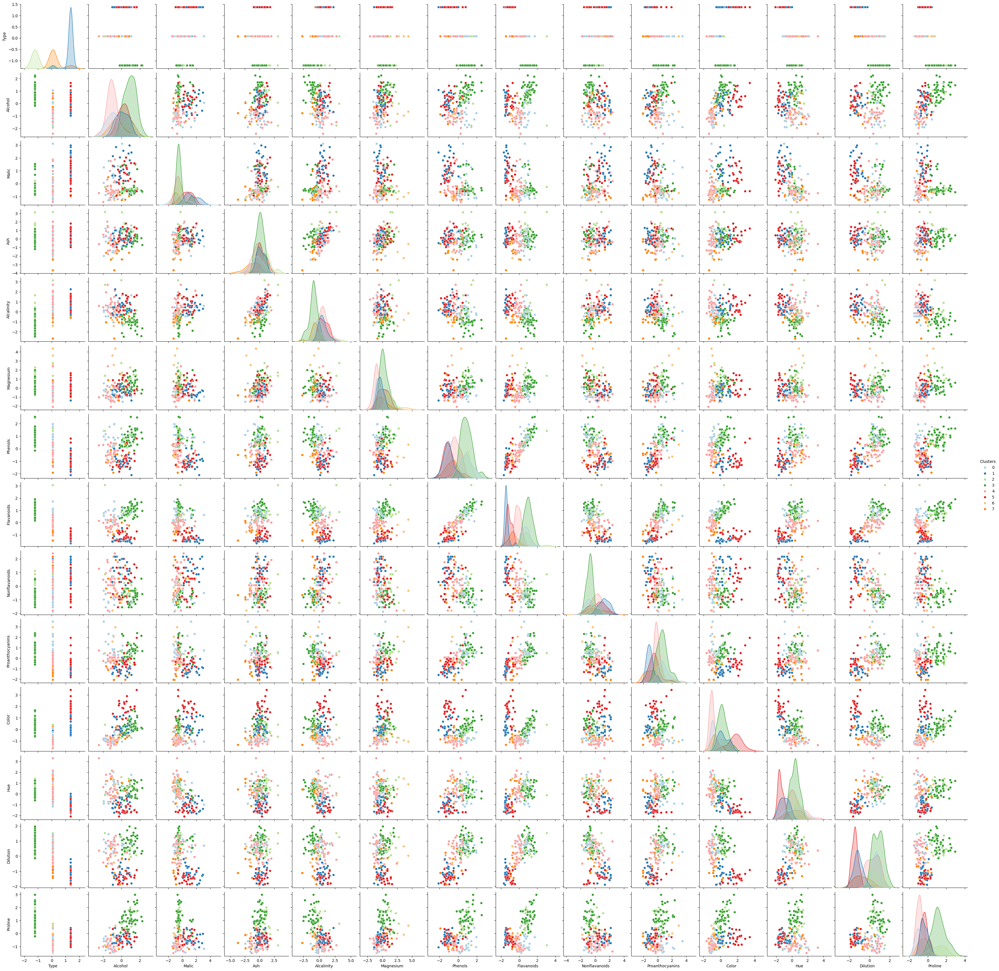

In [110]:
# Plot the scatter plots and histograms 

sns.pairplot(scaleddf, hue=scaleddf.columns[-1], palette='Paired')

The KMeans algorithm has created 8 clusters. Let us find the WCSS values for when no of clusters are 1 to 10.

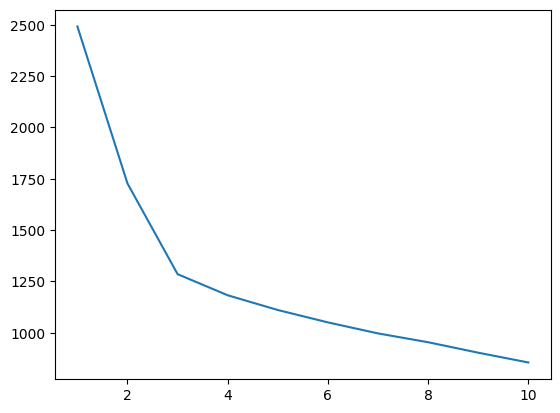

In [113]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(scaleddf.iloc[:,:-1])
    wcss.append(km.inertia_)

plt.plot(range(1,11),wcss)

We see that there are no drastic changes of wcss values when cluster become grater than 3. Therefore we choose total no of clusters as 3.

In [114]:
# Drop Clusters column and create a new column with only 3 clusters

scaleddf.drop(columns='Clusters',inplace=True)

km = KMeans(n_clusters=3)
km.fit_predict(scaleddf)

scaleddf['Clusters'] = km.labels_

scaleddf.head()

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline,Clusters
0,-1.213944,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009,0
1,-1.213944,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242,0
2,-1.213944,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148,0
3,-1.213944,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574,0
4,-1.213944,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874,0


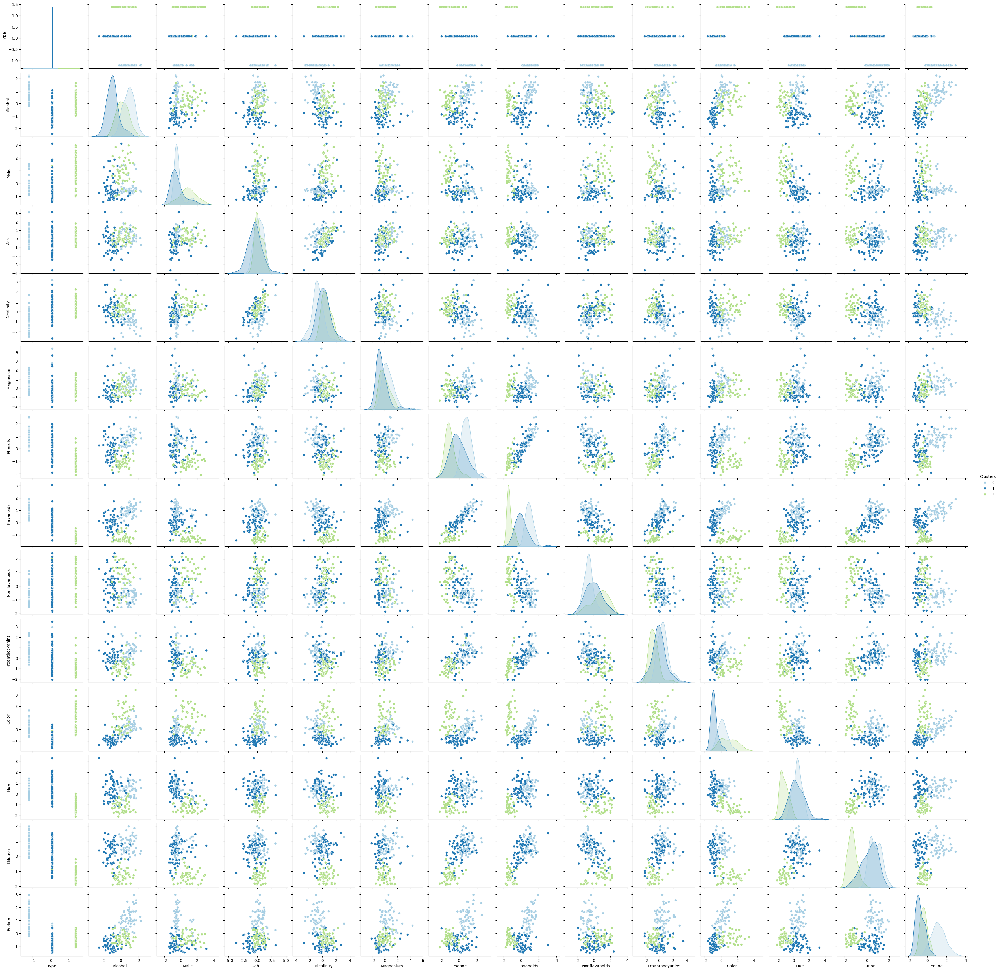

In [116]:
# Plot the scatter plots and histograms 

sns.pairplot(scaleddf, hue=scaleddf.columns[-1], palette='Paired')

In [117]:
# Evaluation using Silhouette score

from sklearn.metrics import silhouette_score

In [118]:
silhouette_score(scaleddf.iloc[:,:-1],scaleddf['Clusters'])

0.30773604383565206

The value obtained is between 0 and +1 which indicates a good clustering, but there are  outliers present.

In [120]:
scaleddf.groupby('Clusters').agg('mean')

,Type,Alcohol,Malic,Ash,Alcalinity,Magnesium,Phenols,Flavanoids,Nonflavanoids,Proanthocyanins,Color,Hue,Dilution,Proline
Clusters,,,,,,,,,,,,,,
0,-1.171521,0.878097,-0.304576,0.318942,-0.664524,0.564888,0.876505,0.943639,-0.585590,0.581783,0.167188,0.483728,0.767053,1.158347
1,0.079960,-0.922126,-0.378889,-0.465688,0.175507,-0.470251,-0.073934,0.044288,0.008761,0.018265,-0.862278,0.424503,0.249782,-0.765250
2,1.347458,0.186543,0.904971,0.249210,0.583703,-0.050635,-0.988557,-1.236195,0.716842,-0.749608,0.988498,-1.191299,-1.301540,-0.380045


## Applying Clustering to PCA dataset

In [123]:
pcs_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,-3.522934,-1.453098,-0.164795,-0.013273,0.737345,-0.300716,0.573876,0.055637
1,-2.528858,0.330019,-2.026707,-0.417144,-0.283214,-0.884309,-0.029716,1.010372
2,-2.785029,-1.036936,0.983238,0.664232,-0.387565,0.468842,0.488305,-0.268957
3,-3.922588,-2.768210,-0.174968,0.565088,-0.324360,0.262616,-0.398364,0.618844
4,-1.407511,-0.867773,2.025829,-0.440906,0.227949,-0.593762,0.447876,0.434937


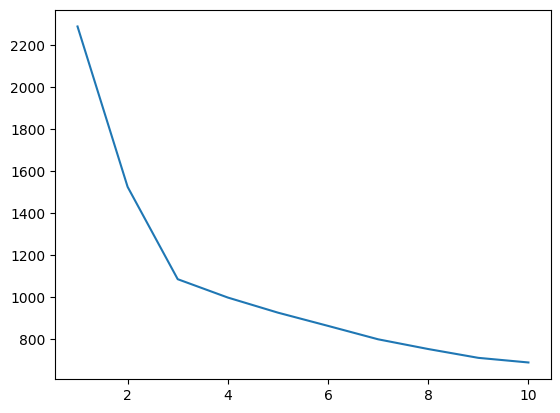

In [125]:
# Find the ideal number of clusters for the above 8 PCs
wcss=[]

for i in range(1,11):
    kmpcs = KMeans(n_clusters=i)
    kmpcs.fit_predict(pcs_df)
    wcss.append(kmpcs.inertia_)

plt.plot(range(1,11),wcss)

In [127]:
# Again we see there is a sharp deviation in WCSS value on the PCs

kmpcs = KMeans(n_clusters=3)
kmpcs.fit_predict(pcs_df)

pcs_df['Clusters'] = kmpcs.labels_

pcs_df.groupby('Clusters').agg('mean')

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
Clusters,,,,,,,,
0,0.121711,1.750369,0.128334,0.094233,0.056204,0.116009,0.016451,0.006441
1,3.058665,-1.208263,-0.177541,0.095731,0.071641,0.094968,-0.062648,-0.044149
2,-2.548859,-0.936610,0.001632,-0.177491,-0.117356,-0.200419,0.031734,0.027931


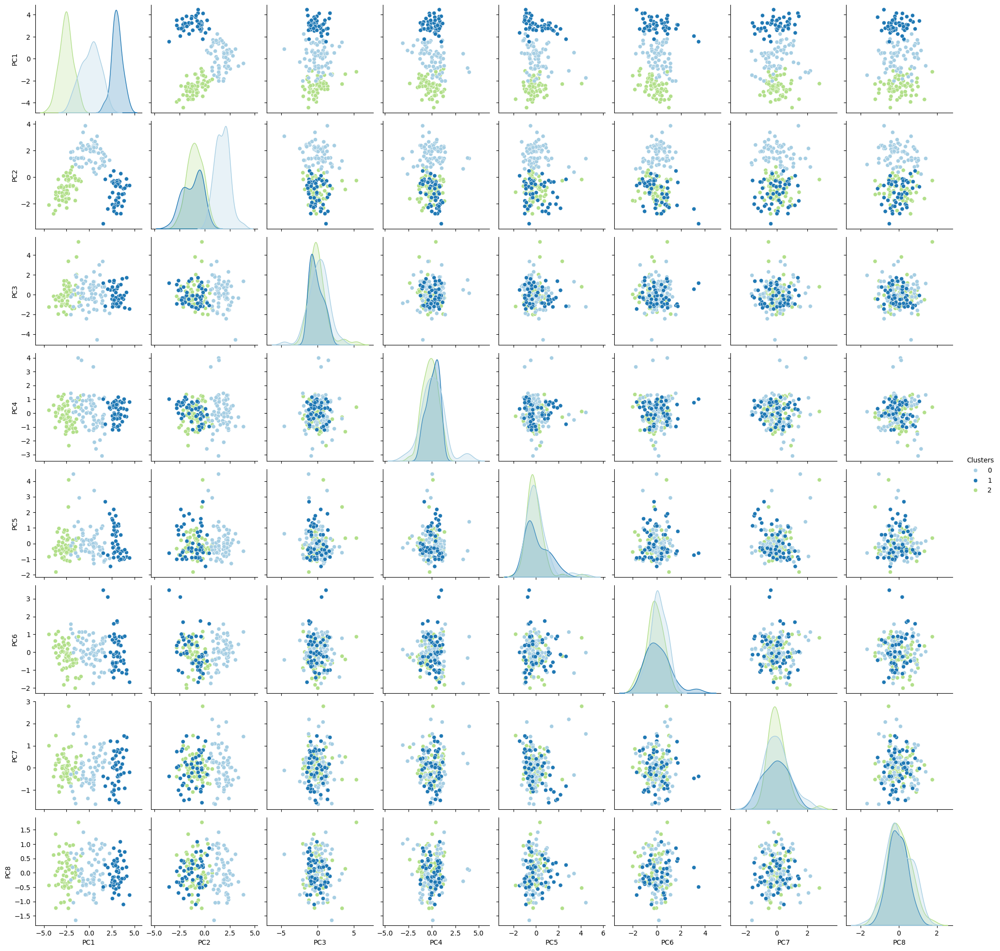

In [128]:
sns.pairplot(pcs_df, hue='Clusters', palette='Paired')

In [130]:
# Evalute Silhouette scores for both CLustering models
silhouette_score(pcs_df.iloc[:,:-1],pcs_df['Clusters']), silhouette_score(scaleddf.iloc[:,:-1],scaleddf['Clusters'])

(0.34024286668577897, 0.30773604383565206)

The Silhouette score for the model created using 8 Principal components provide a slightly better score, which indicates better clustering than the Original Scaled dataset

The use of PCA has reduced the no of dimensions for our analysis which resulted in a better cluster model, but at the cost of ~10% loss of data.

# Summary
Advantages of PCA
- Using PCA technique we were able to reduce the dimensions of the dataset by retaining 90% of the original data
- The cluster model created using the PCs are silghtly better than the model created using the original dataset with a silhouette score of 0.34
- Using PCA reduced the dimensional complexity from 14 to 8
- Easier to visualize or analyze 8 dimensions than 14
- PCA creates uncorrelated features which can be beneficial to certain types of models which are sensitive to multicollinearity

Disadvantages of PCA
- Loss of data by reducing the no of dimensions
- Data interpretability is less
- PCA requires the data to be having linear relationships among features

When to use PCA:
- When there is a high no. of features within the dataset.
- If the features are highly correlated to each other.
- If the data has lot of outliers.

When not to use PCA
- Data interpretation is crucial.
- If the data is non-linearly correlated